# ImageNet + Unet++

1) load a data for a test
2) update a loop for test
3) for each epoch display a training loss , validation loss and test loss + ssim value also

# Data Loading

## Train

In [1]:
X_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy'
y_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy'

## Test

In [2]:
X_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-test-data/2024-06-10_0d6402b1/seismic_w_noise_vol_44319345.npy'
y_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487919/seismicCubes_RFC_fullstack_2024.42487919.npy'

## Valid

In [3]:
X_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismic_w_noise_vol_42502775.npy'
y_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismicCubes_RFC_fullstack_2024.42502775.npy'

In [4]:
shape = (1259,300,300)
# load the data
# make the data in 2d section
# make the train set and test set
# print the image also

In [5]:
import os
import pandas as pd
import numpy as np
from torchvision.io import read_image
from torch.utils.data import Dataset,DataLoader
import torch
# 2 files
# 1259*300*300 ---> 1259*300 in 300 images
# x,y load
# x,y sub sample
# pair
# return
class volDataset(Dataset):
    def __init__(self, x_slices, y_slices, transform=None):
        """
        x_slices: List of noisy seismic slices (each of shape 1259x300)
        y_slices: List of clean seismic slices (each of shape 1259x300)
        """
        self.x_slices = x_slices
        self.y_slices = y_slices
        self.transform = transform

    def __len__(self):
        return len(self.x_slices)

    def __getitem__(self, idx):
        """Returns one slice (1, 1259, 300)"""
        x_slice = torch.tensor(self.x_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)
        y_slice = torch.tensor(self.y_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)

        if self.transform:
            x_slice = self.transform(x_slice)
            y_slice = self.transform(y_slice)

        return x_slice, y_slice

In [6]:
from sklearn.model_selection import train_test_split
# Convert volume to 2D slices
# Load seismic volumes
X_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy',allow_pickle=True)  # (1259, 300, 300)
y_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy',allow_pickle=True)  # (1259, 300, 300)

X_volume_t = np.load(X_test_path,allow_pickle=True)
y_volume_t = np.load(y_test_path,allow_pickle=True)

X_volume_v = np.load(X_valid_path,allow_pickle=True)
y_volume_v = np.load(y_valid_path,allow_pickle=True)
# Convert volume to 2D slices

X_slices = [X_volume[:, :, i] for i in range(X_volume.shape[2])]  # List of 300 slices
y_slices = [y_volume[:, :, i] for i in range(y_volume.shape[2])]  # List of 300 slices

X_slices_t = [X_volume_t[:, :, i] for i in range(X_volume_t.shape[2])]
y_slices_t = [y_volume_t[:, :, i] for i in range(y_volume_t.shape[2])]

X_slices_v = [X_volume_v[:, :, i] for i in range(X_volume_v.shape[2])]
y_slices_v = [y_volume_v[:, :, i] for i in range(y_volume_v.shape[2])]

# Create datasets
train_dataset = volDataset(X_slices, y_slices)
valid_dataset = volDataset(X_slices_v,y_slices_v)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(valid_dataset,batch_size=8, shuffle=False)

# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break
for x_batch, y_batch in val_loader:
    print("valid Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])
valid Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


# Model

In [7]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

In [8]:
class Crop2d(nn.Module):
    def __init__(self, left=10, right=10, top=21, bottom=0):
        super(Crop2d, self).__init__()
        self.left = left
        self.right = right
        self.top = top
        self.bottom = bottom

    def forward(self, x):
        return x[:, :, self.top:x.shape[2] - self.bottom, self.left:x.shape[3] - self.right]

In [11]:
import timm
from segmentation_models_pytorch.decoders.unetplusplus import UnetPlusPlus

/home/simlab120/anaconda3/envs/torch/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
import torch
import torch.nn as nn
import torchvision
from torchvision.models import resnext101_64x4d, ResNeXt101_64X4D_Weights
import segmentation_models_pytorch as smp


class CNNModel(nn.Module):
    def __init__(self):
        super().__init__()

        # Optional zero-padding
        self.zero_pad = nn.ZeroPad2d((10, 10, 21, 0))

        # SMP handles encoder + decoder automatically
        self.model = smp.UnetPlusPlus(
            encoder_name="resnext101_32x8d",    # or "resnext101_64x4d" if supported
            encoder_weights="imagenet",
            in_channels=1,                      # you MUST make sure it handles 1-channel input
            classes=1
        )

        self.crop = Crop2d(10, 10, 21, 0)

    def forward(self, x):
        x = self.zero_pad(x)
        x = self.model(x)  # Encoder + Decoder together
        x = self.crop(x)
        return x

model = CNNModel()
x = torch.randn(1, 1, 1259, 300)
out = model(x)
print(out.shape)

Downloading: "https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth" to /home/simlab120/.cache/torch/hub/checkpoints/resnext101_32x8d-8ba56ff5.pth
100%|██████████| 340M/340M [00:17<00:00, 20.0MB/s] 


torch.Size([1, 1, 1259, 300])


In [13]:
pip install torcheval

Note: you may need to restart the kernel to use updated packages.


In [14]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define model
model = CNNModel()

# Define Loss Function (MSE for denoising)
criterion = nn.MSELoss()

# Define Optimizer (Adam works well)
optimizer = optim.Adam(model.parameters(), lr=0.1)

In [15]:
# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (batch_size, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


In [16]:
from torchmetrics import StructuralSimilarityIndexMeasure
ssim_metric = StructuralSimilarityIndexMeasure()

/home/simlab120/anaconda3/envs/torch/lib/python3.12/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


In [17]:
import matplotlib.pyplot as plt

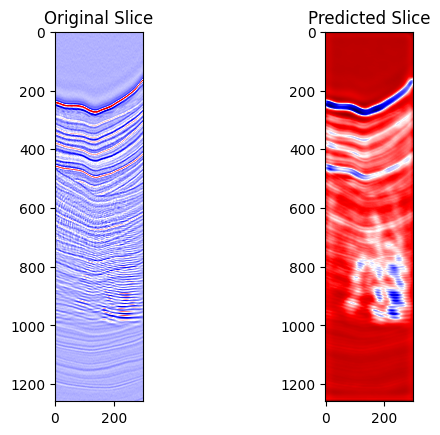

Epoch [1/200], Train Loss: 4467.4616, Train SSIM: 0.6141,           Val Loss: 527343.6135, Val SSIM: 0.0011


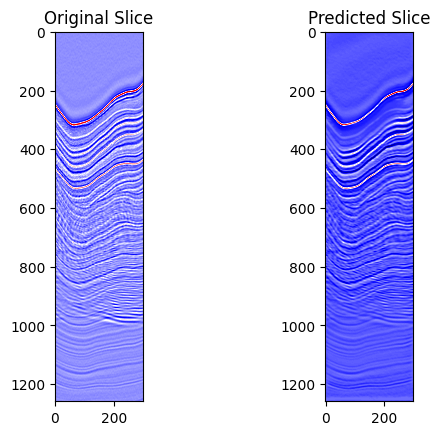

Epoch [2/200], Train Loss: 1009.8569, Train SSIM: 0.8118,           Val Loss: 3761.1979, Val SSIM: 0.6899


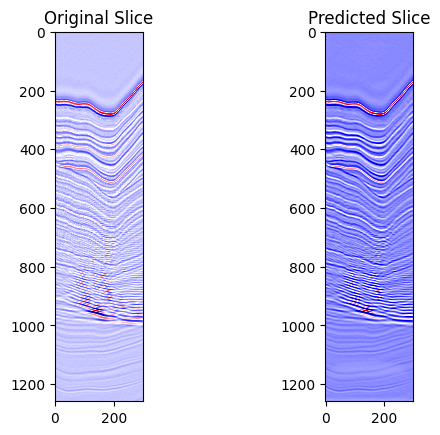

Epoch [3/200], Train Loss: 573.6335, Train SSIM: 0.8550,           Val Loss: 1939.7044, Val SSIM: 0.7110


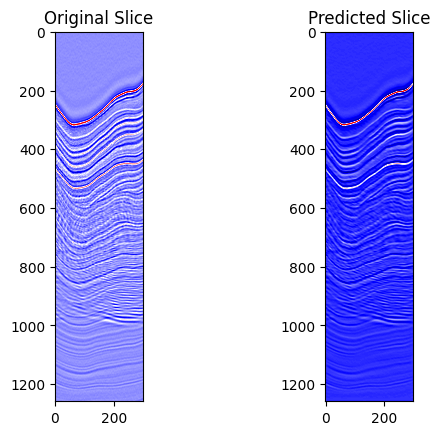

Epoch [4/200], Train Loss: 482.8973, Train SSIM: 0.8694,           Val Loss: 1669.5728, Val SSIM: 0.7321


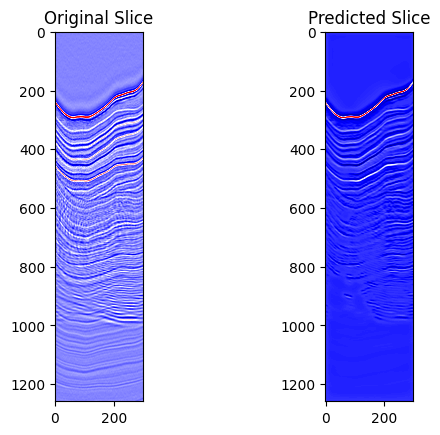

Epoch [5/200], Train Loss: 446.4361, Train SSIM: 0.8765,           Val Loss: 3238.1934, Val SSIM: 0.4692


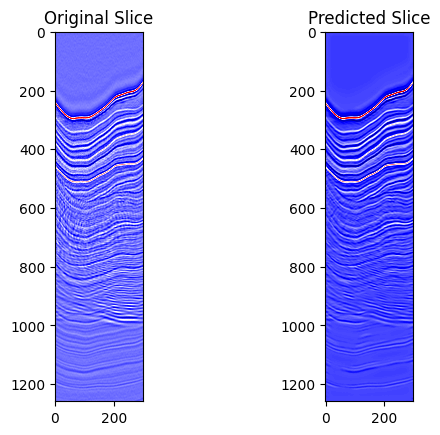

Epoch [6/200], Train Loss: 398.2766, Train SSIM: 0.8871,           Val Loss: 2087.1482, Val SSIM: 0.6654


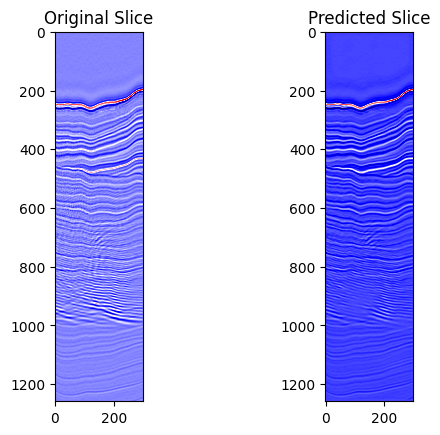

Epoch [7/200], Train Loss: 343.9150, Train SSIM: 0.9001,           Val Loss: 931.0299, Val SSIM: 0.8715


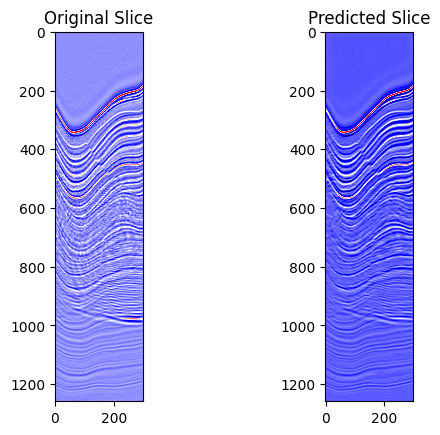

Epoch [8/200], Train Loss: 316.0995, Train SSIM: 0.9059,           Val Loss: 1810.6527, Val SSIM: 0.6395


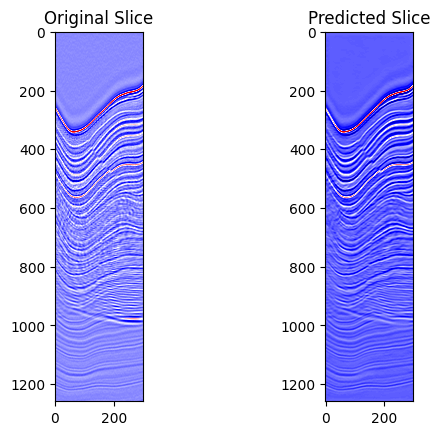

Epoch [9/200], Train Loss: 283.6500, Train SSIM: 0.9119,           Val Loss: 919.1886, Val SSIM: 0.8663


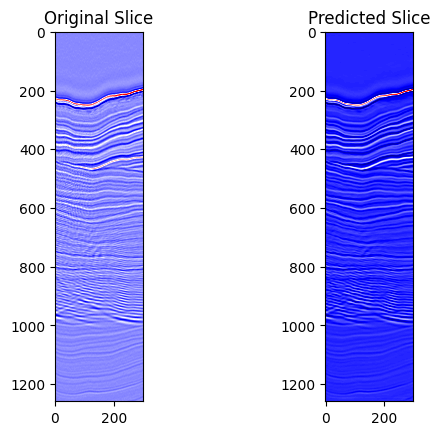

Epoch [10/200], Train Loss: 260.6999, Train SSIM: 0.9182,           Val Loss: 1743.6990, Val SSIM: 0.7680


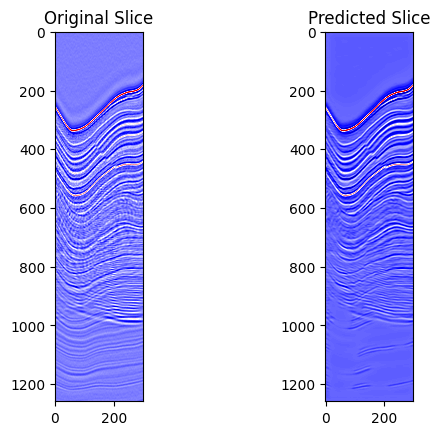

Epoch [11/200], Train Loss: 244.1288, Train SSIM: 0.9225,           Val Loss: 983.0146, Val SSIM: 0.8495


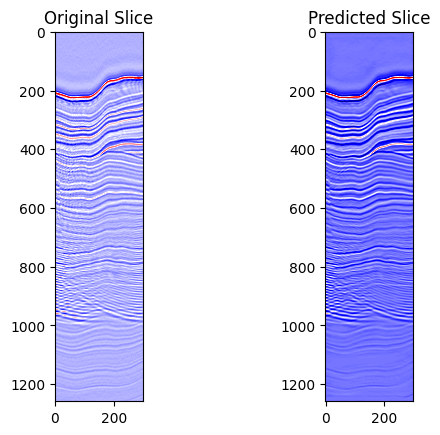

Epoch [12/200], Train Loss: 216.8882, Train SSIM: 0.9294,           Val Loss: 1758.7070, Val SSIM: 0.8024


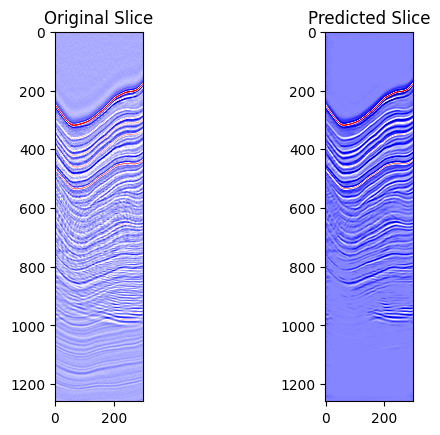

Epoch [13/200], Train Loss: 195.0778, Train SSIM: 0.9352,           Val Loss: 1644.3372, Val SSIM: 0.7661


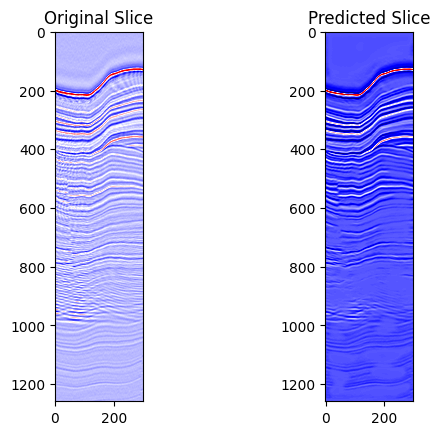

Epoch [14/200], Train Loss: 172.3112, Train SSIM: 0.9418,           Val Loss: 1027.7190, Val SSIM: 0.8505


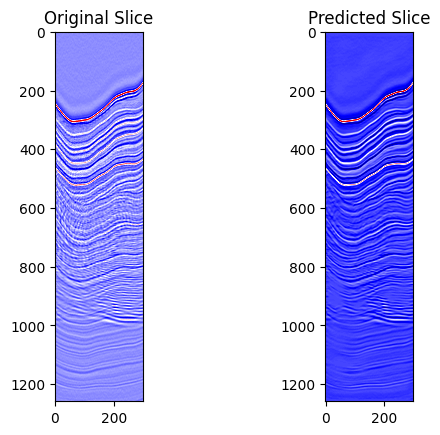

Epoch [15/200], Train Loss: 151.1095, Train SSIM: 0.9481,           Val Loss: 1398.6528, Val SSIM: 0.8545


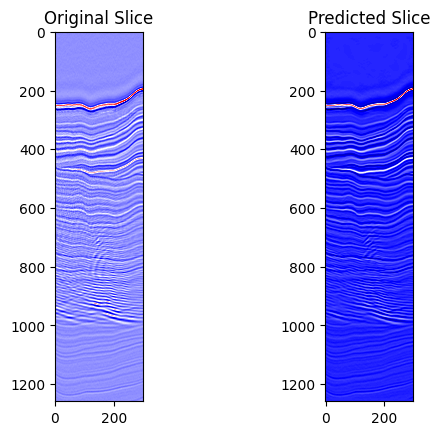

Epoch [16/200], Train Loss: 137.2502, Train SSIM: 0.9527,           Val Loss: 1506.9903, Val SSIM: 0.8090


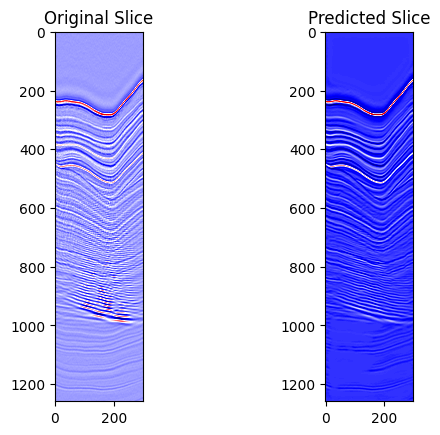

Epoch [17/200], Train Loss: 130.7111, Train SSIM: 0.9548,           Val Loss: 932.6801, Val SSIM: 0.8793


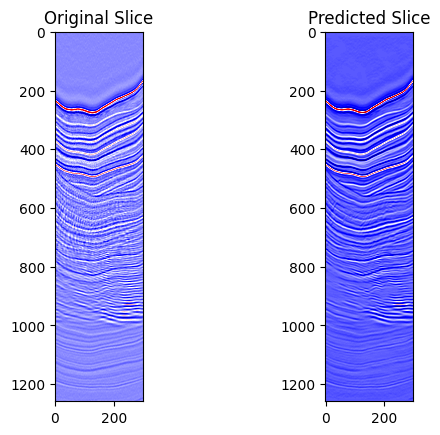

Epoch [18/200], Train Loss: 127.5082, Train SSIM: 0.9573,           Val Loss: 1735.7275, Val SSIM: 0.7798


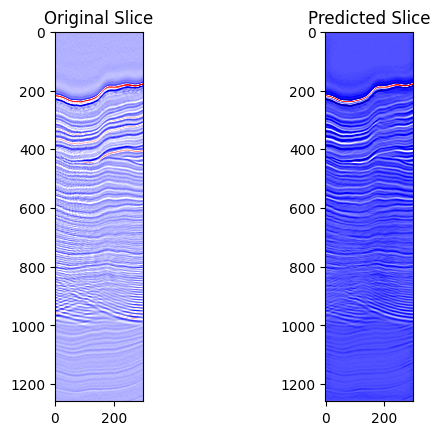

Epoch [19/200], Train Loss: 121.2956, Train SSIM: 0.9598,           Val Loss: 1036.3918, Val SSIM: 0.7753


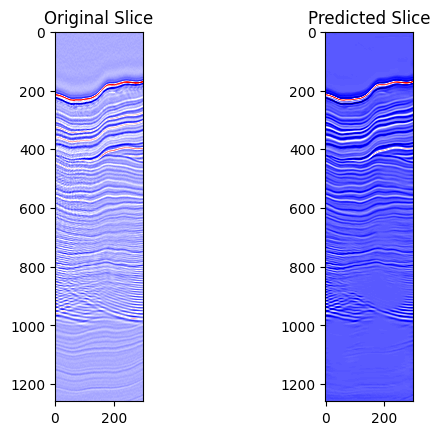

Epoch [20/200], Train Loss: 110.1903, Train SSIM: 0.9631,           Val Loss: 1419.3858, Val SSIM: 0.8120


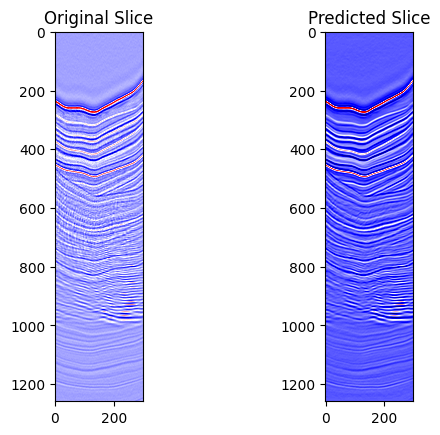

Epoch [21/200], Train Loss: 107.9642, Train SSIM: 0.9646,           Val Loss: 1739.2396, Val SSIM: 0.7773


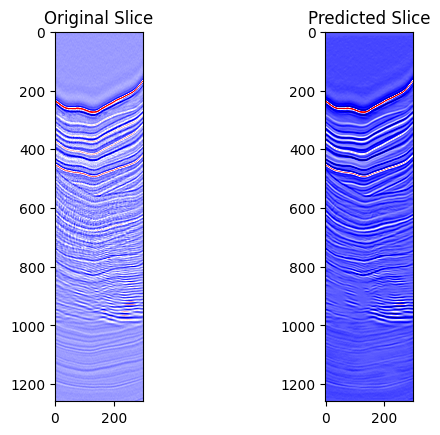

Epoch [22/200], Train Loss: 106.1806, Train SSIM: 0.9661,           Val Loss: 1385.6407, Val SSIM: 0.8486


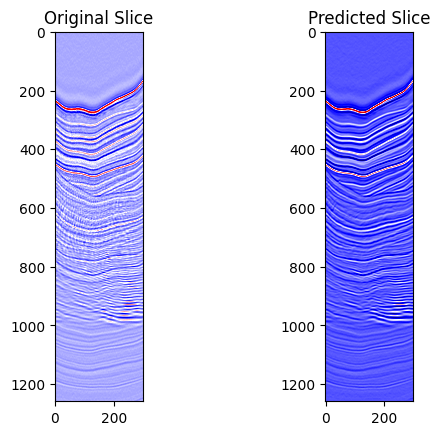

Epoch [23/200], Train Loss: 99.6189, Train SSIM: 0.9680,           Val Loss: 1840.0921, Val SSIM: 0.6965


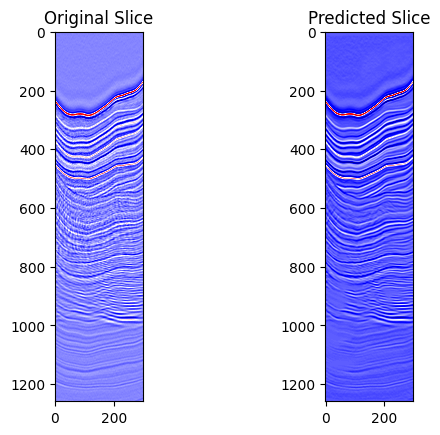

Epoch [24/200], Train Loss: 90.4487, Train SSIM: 0.9706,           Val Loss: 1411.0746, Val SSIM: 0.8561


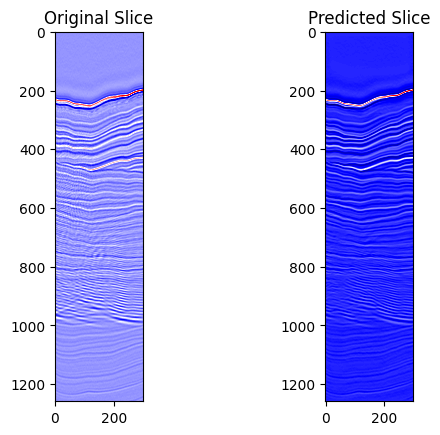

Epoch [25/200], Train Loss: 93.1948, Train SSIM: 0.9707,           Val Loss: 918.5339, Val SSIM: 0.8600


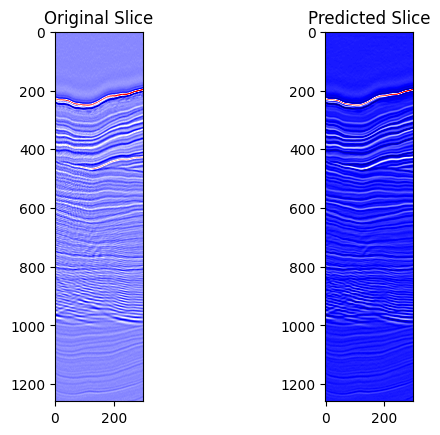

Epoch [26/200], Train Loss: 87.4246, Train SSIM: 0.9728,           Val Loss: 1871.4405, Val SSIM: 0.6712


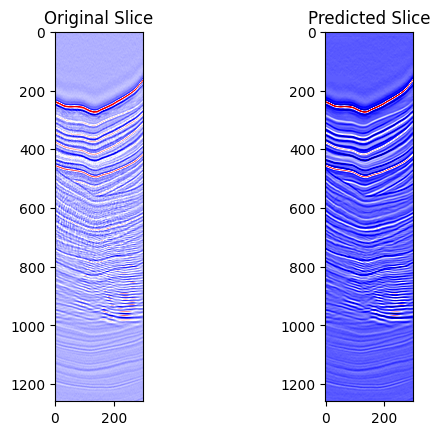

Epoch [27/200], Train Loss: 86.6631, Train SSIM: 0.9720,           Val Loss: 1618.1024, Val SSIM: 0.7431


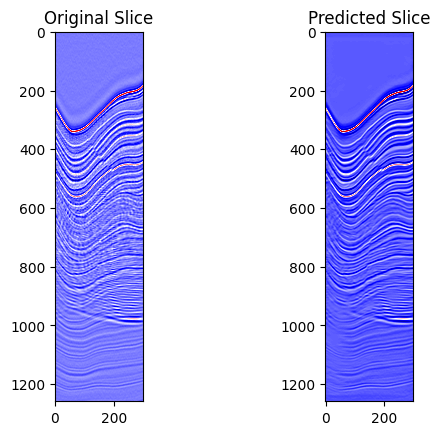

Epoch [28/200], Train Loss: 80.8477, Train SSIM: 0.9747,           Val Loss: 1638.6168, Val SSIM: 0.8347


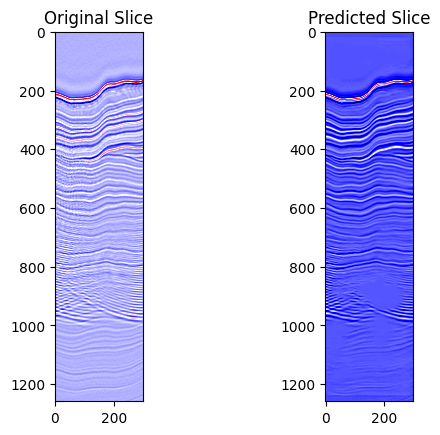

Epoch [29/200], Train Loss: 72.0178, Train SSIM: 0.9769,           Val Loss: 1453.7241, Val SSIM: 0.8383


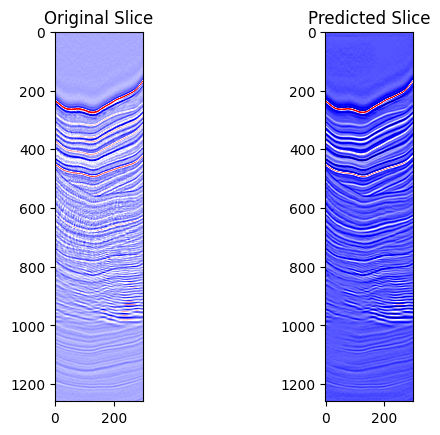

Epoch [30/200], Train Loss: 75.7905, Train SSIM: 0.9765,           Val Loss: 1508.4452, Val SSIM: 0.8189


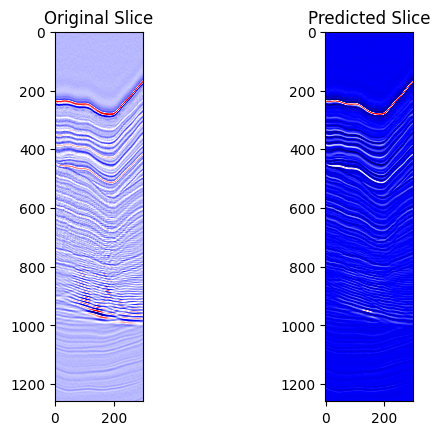

Epoch [31/200], Train Loss: 69.6488, Train SSIM: 0.9788,           Val Loss: 1138.4077, Val SSIM: 0.8627


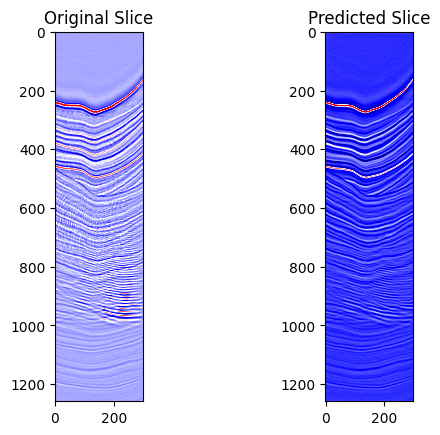

Epoch [32/200], Train Loss: 70.6040, Train SSIM: 0.9781,           Val Loss: 887.6054, Val SSIM: 0.8259


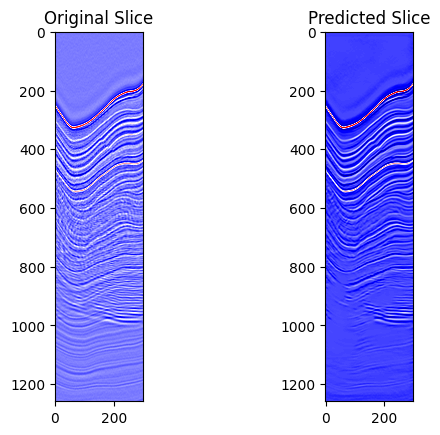

Epoch [33/200], Train Loss: 62.2193, Train SSIM: 0.9803,           Val Loss: 1547.2434, Val SSIM: 0.8292


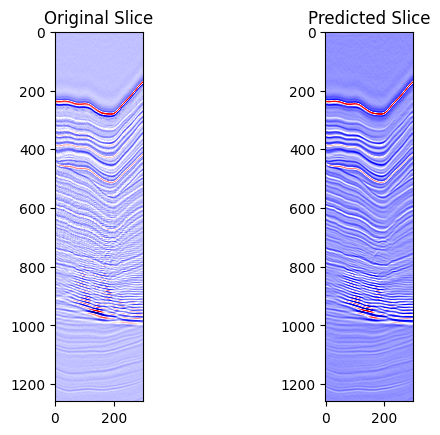

Epoch [34/200], Train Loss: 67.0438, Train SSIM: 0.9799,           Val Loss: 1392.2351, Val SSIM: 0.8341


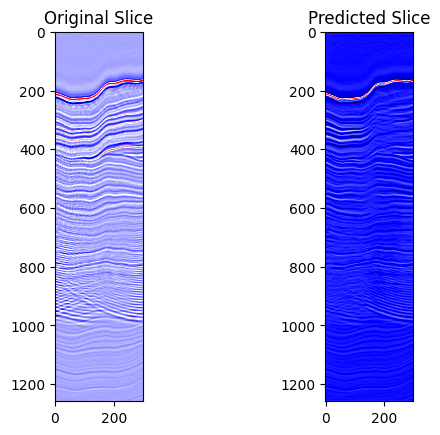

Epoch [35/200], Train Loss: 63.7112, Train SSIM: 0.9803,           Val Loss: 954.7207, Val SSIM: 0.8586


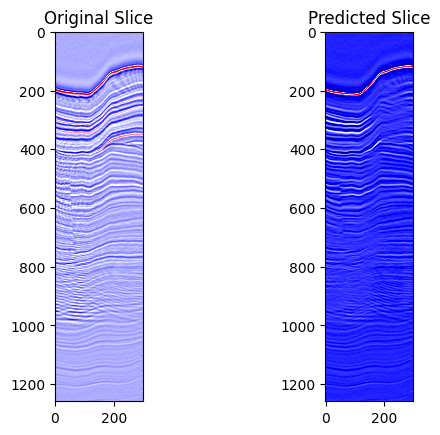

Epoch [36/200], Train Loss: 59.9735, Train SSIM: 0.9816,           Val Loss: 902.2213, Val SSIM: 0.8897


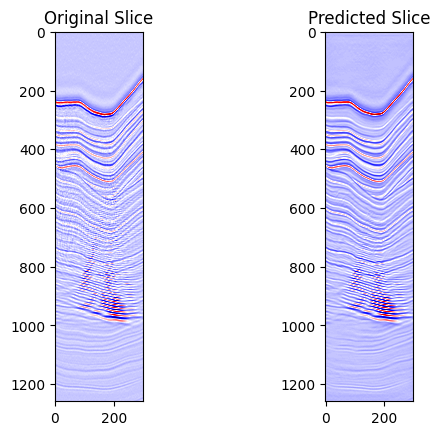

Epoch [37/200], Train Loss: 68.6679, Train SSIM: 0.9797,           Val Loss: 1738.1094, Val SSIM: 0.8366


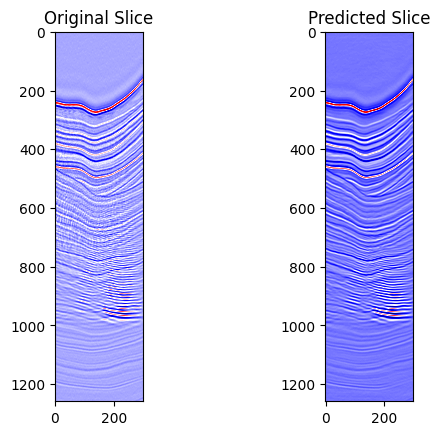

Epoch [38/200], Train Loss: 65.7880, Train SSIM: 0.9808,           Val Loss: 1657.4082, Val SSIM: 0.8152


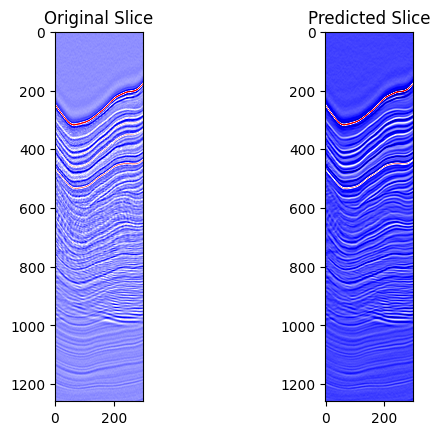

Epoch [39/200], Train Loss: 63.7424, Train SSIM: 0.9812,           Val Loss: 1729.8931, Val SSIM: 0.8223


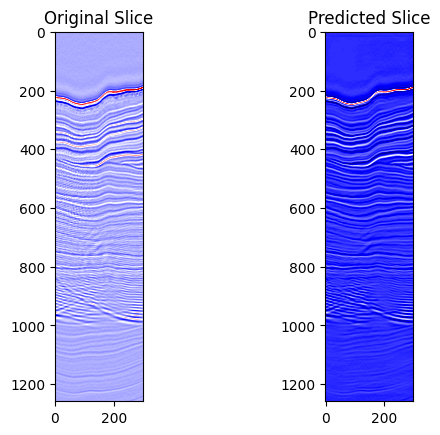

Epoch [40/200], Train Loss: 61.3722, Train SSIM: 0.9818,           Val Loss: 1745.0285, Val SSIM: 0.8287


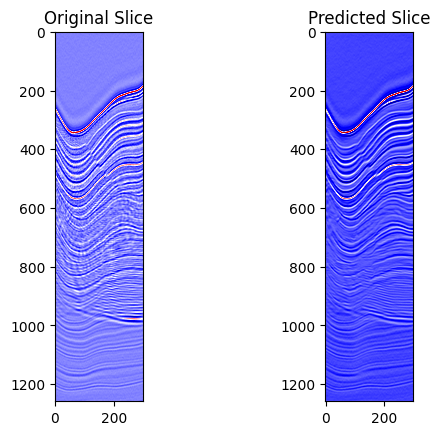

Epoch [41/200], Train Loss: 52.1910, Train SSIM: 0.9841,           Val Loss: 961.7931, Val SSIM: 0.8906


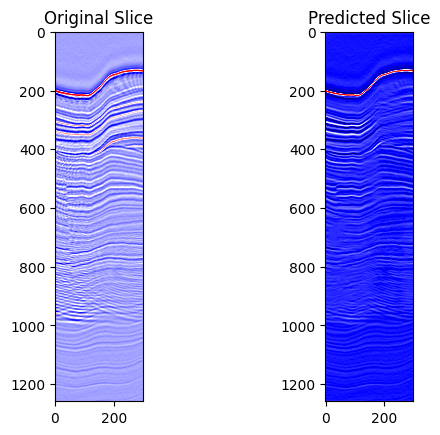

Epoch [42/200], Train Loss: 55.8872, Train SSIM: 0.9838,           Val Loss: 1067.5186, Val SSIM: 0.8162


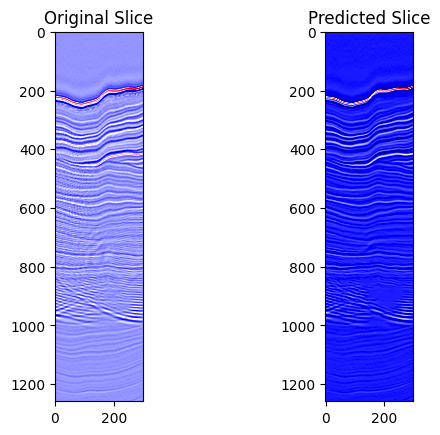

Epoch [43/200], Train Loss: 52.1231, Train SSIM: 0.9837,           Val Loss: 1556.0662, Val SSIM: 0.8086


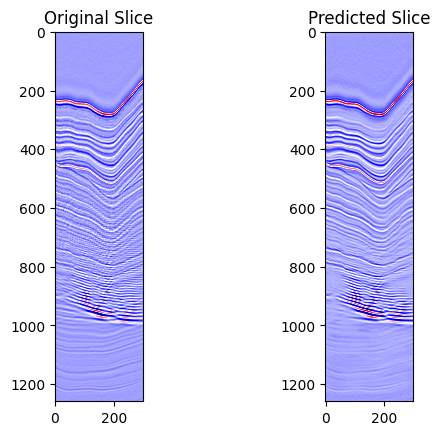

Epoch [44/200], Train Loss: 60.3175, Train SSIM: 0.9844,           Val Loss: 1610.4232, Val SSIM: 0.8150


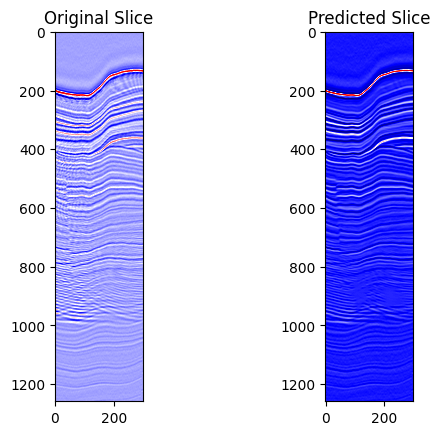

Epoch [45/200], Train Loss: 63.8094, Train SSIM: 0.9812,           Val Loss: 1468.0421, Val SSIM: 0.8147


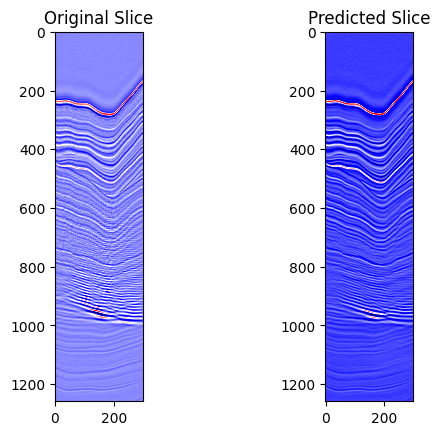

Epoch [46/200], Train Loss: 66.9507, Train SSIM: 0.9819,           Val Loss: 1535.4667, Val SSIM: 0.8631


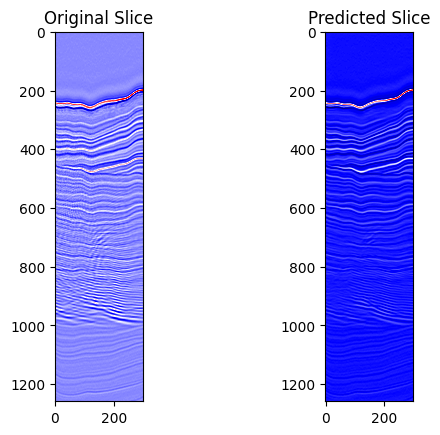

Epoch [47/200], Train Loss: 55.6121, Train SSIM: 0.9841,           Val Loss: 997.9063, Val SSIM: 0.8792


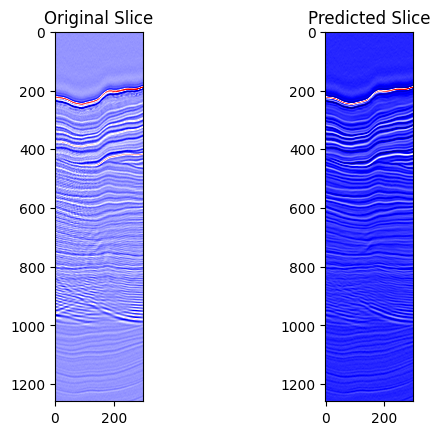

Epoch [48/200], Train Loss: 51.4807, Train SSIM: 0.9845,           Val Loss: 1021.1066, Val SSIM: 0.8736


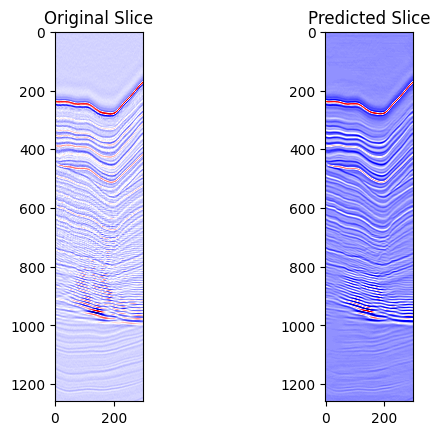

Epoch [49/200], Train Loss: 50.8799, Train SSIM: 0.9850,           Val Loss: 1567.2412, Val SSIM: 0.8275


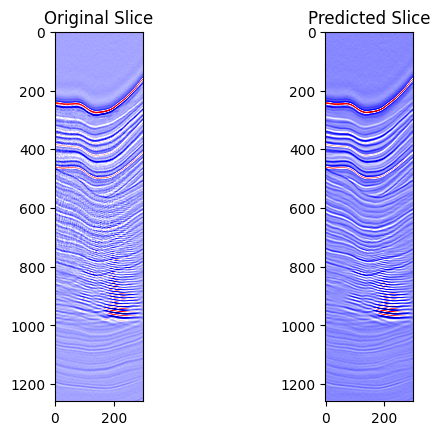

Epoch [50/200], Train Loss: 44.2188, Train SSIM: 0.9866,           Val Loss: 1517.2345, Val SSIM: 0.8310


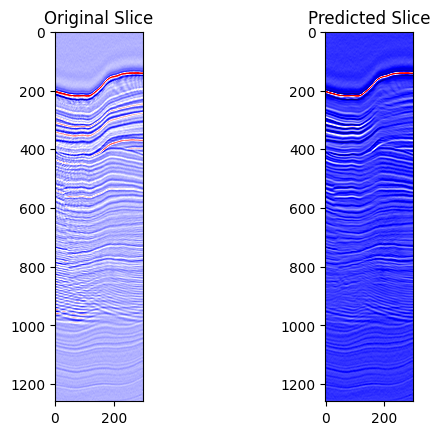

Epoch [51/200], Train Loss: 44.3361, Train SSIM: 0.9873,           Val Loss: 1044.6755, Val SSIM: 0.8714


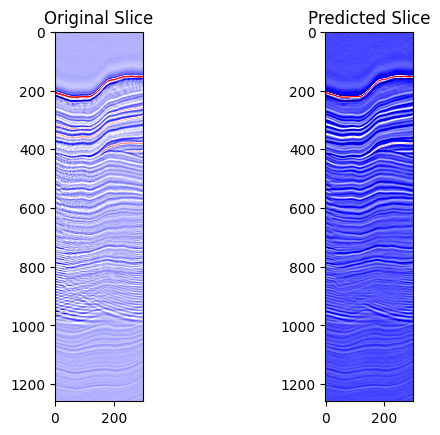

Epoch [52/200], Train Loss: 46.3575, Train SSIM: 0.9863,           Val Loss: 1603.6637, Val SSIM: 0.8458


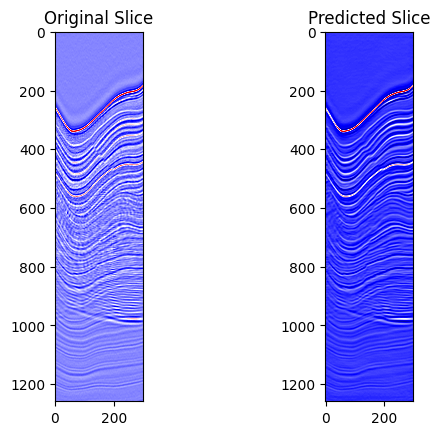

Epoch [53/200], Train Loss: 44.7319, Train SSIM: 0.9874,           Val Loss: 1633.0458, Val SSIM: 0.8347


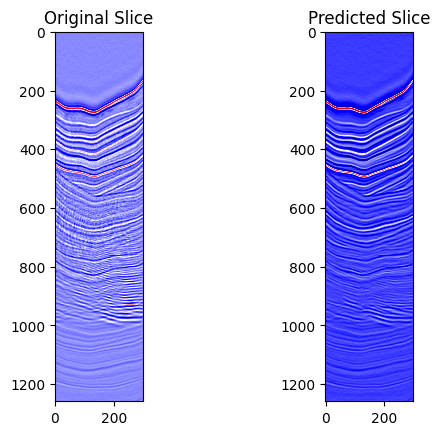

Epoch [54/200], Train Loss: 50.0485, Train SSIM: 0.9860,           Val Loss: 1635.1536, Val SSIM: 0.7977


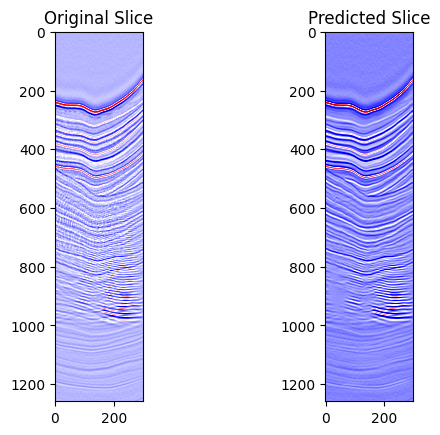

Epoch [55/200], Train Loss: 42.9332, Train SSIM: 0.9875,           Val Loss: 1629.8182, Val SSIM: 0.8351


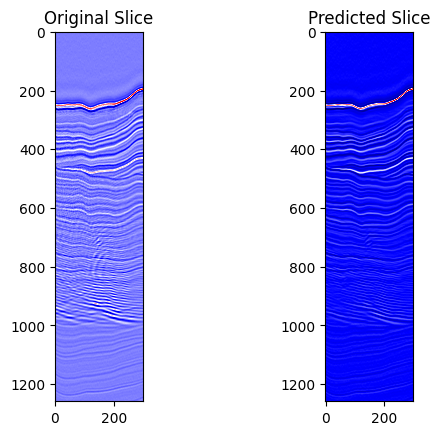

Epoch [56/200], Train Loss: 41.8702, Train SSIM: 0.9880,           Val Loss: 1354.7089, Val SSIM: 0.8607


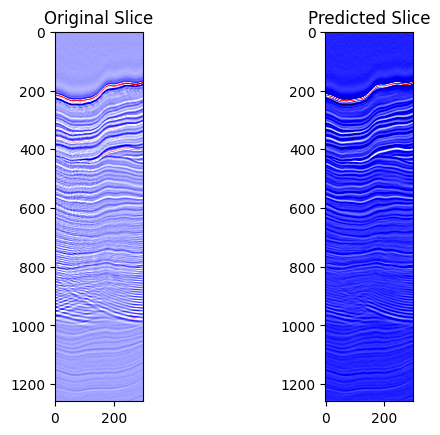

Epoch [57/200], Train Loss: 40.4998, Train SSIM: 0.9886,           Val Loss: 989.9656, Val SSIM: 0.8787


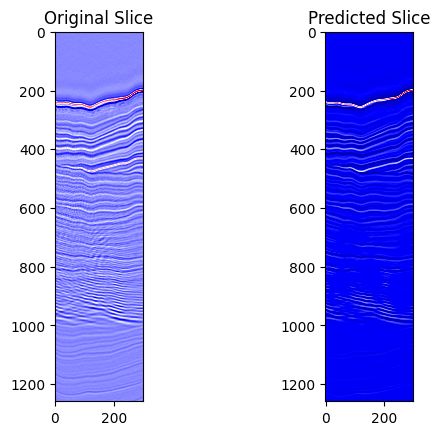

Epoch [58/200], Train Loss: 46.9258, Train SSIM: 0.9869,           Val Loss: 1694.8923, Val SSIM: 0.7721


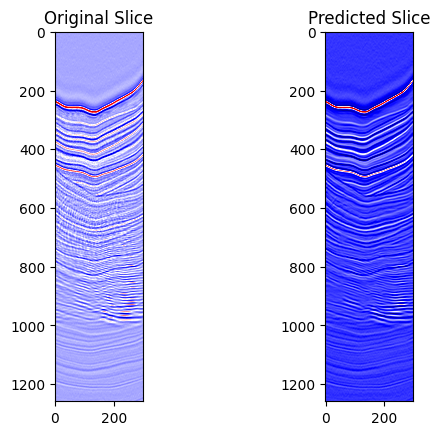

Epoch [59/200], Train Loss: 49.4659, Train SSIM: 0.9861,           Val Loss: 1555.1980, Val SSIM: 0.8224


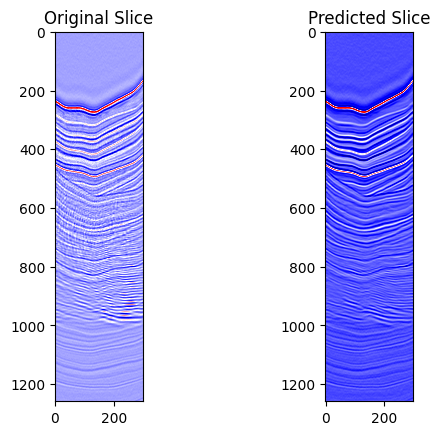

Epoch [60/200], Train Loss: 44.6157, Train SSIM: 0.9872,           Val Loss: 1419.1235, Val SSIM: 0.8608


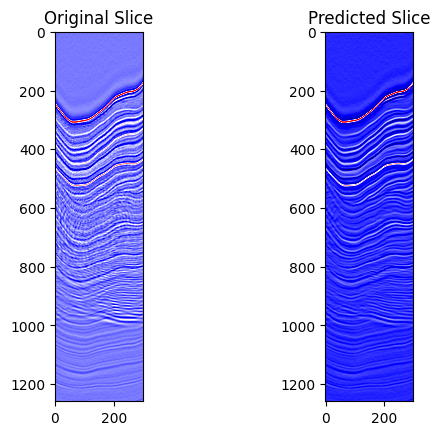

Epoch [61/200], Train Loss: 39.8246, Train SSIM: 0.9882,           Val Loss: 1489.9141, Val SSIM: 0.8485


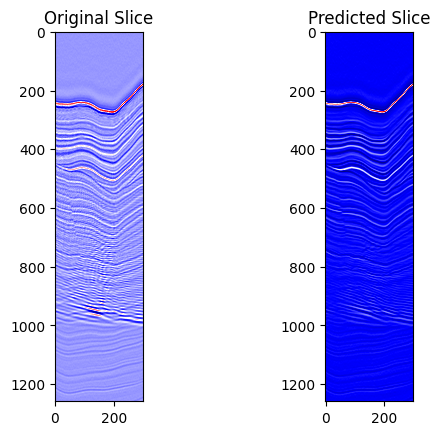

Epoch [62/200], Train Loss: 40.8860, Train SSIM: 0.9884,           Val Loss: 1002.0906, Val SSIM: 0.8872


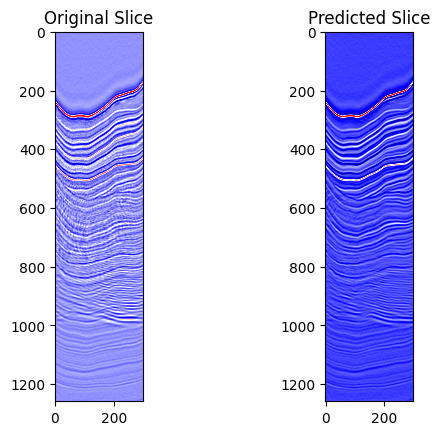

Epoch [63/200], Train Loss: 42.6375, Train SSIM: 0.9877,           Val Loss: 1002.5232, Val SSIM: 0.8819


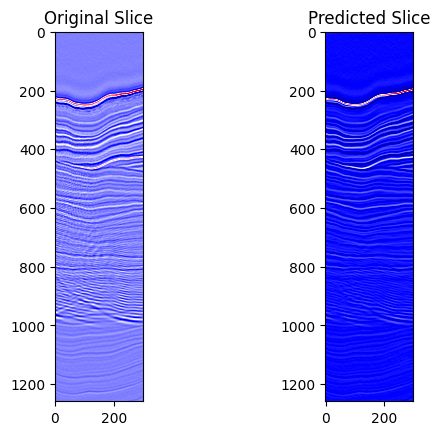

Epoch [64/200], Train Loss: 37.4314, Train SSIM: 0.9891,           Val Loss: 1424.4435, Val SSIM: 0.8451


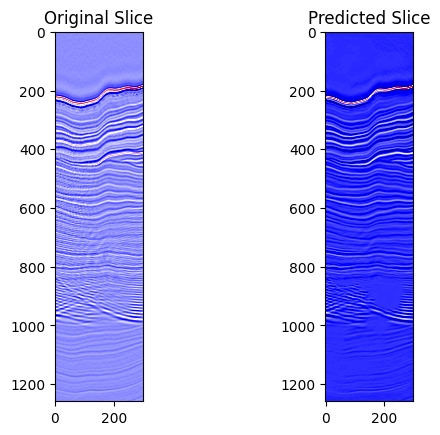

Epoch [65/200], Train Loss: 39.3364, Train SSIM: 0.9889,           Val Loss: 1626.4112, Val SSIM: 0.8221


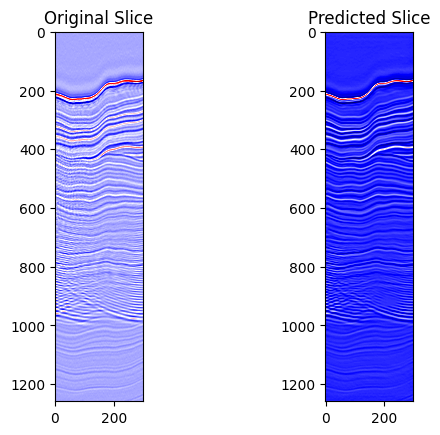

Epoch [66/200], Train Loss: 36.5686, Train SSIM: 0.9895,           Val Loss: 1582.0378, Val SSIM: 0.8400


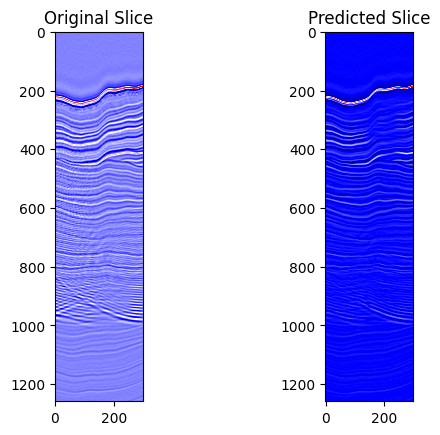

Epoch [67/200], Train Loss: 39.8995, Train SSIM: 0.9884,           Val Loss: 1035.6810, Val SSIM: 0.8823


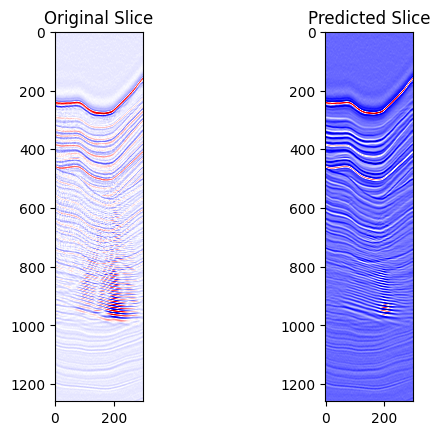

Epoch [68/200], Train Loss: 37.9195, Train SSIM: 0.9893,           Val Loss: 1535.8555, Val SSIM: 0.8400


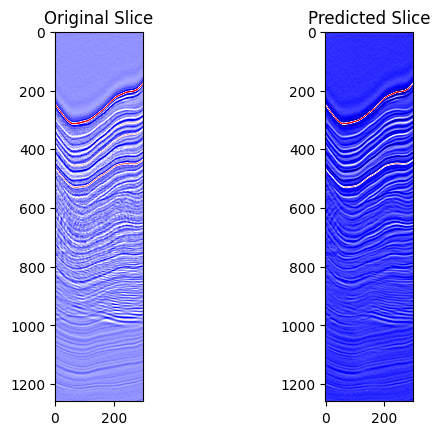

Epoch [69/200], Train Loss: 36.2822, Train SSIM: 0.9895,           Val Loss: 1406.1161, Val SSIM: 0.8579


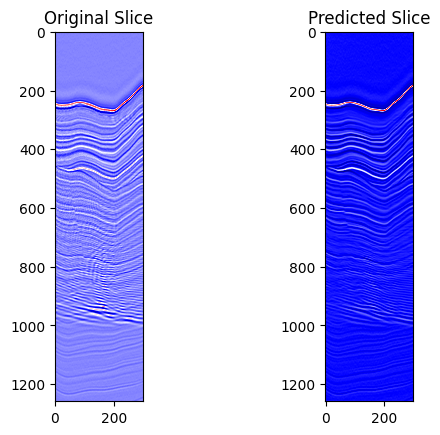

Epoch [70/200], Train Loss: 36.7204, Train SSIM: 0.9897,           Val Loss: 1063.7843, Val SSIM: 0.8536


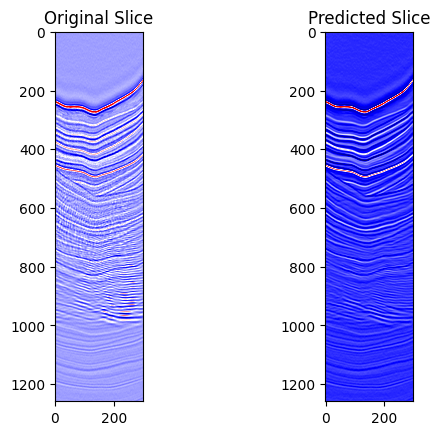

Epoch [71/200], Train Loss: 41.8681, Train SSIM: 0.9879,           Val Loss: 1598.8367, Val SSIM: 0.8475


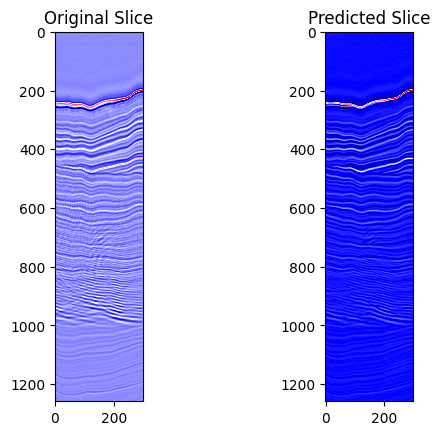

Epoch [72/200], Train Loss: 33.6694, Train SSIM: 0.9902,           Val Loss: 1214.4509, Val SSIM: 0.8704


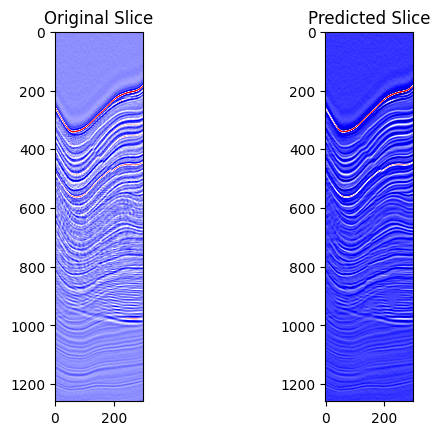

Epoch [73/200], Train Loss: 33.8917, Train SSIM: 0.9901,           Val Loss: 1564.8448, Val SSIM: 0.8366


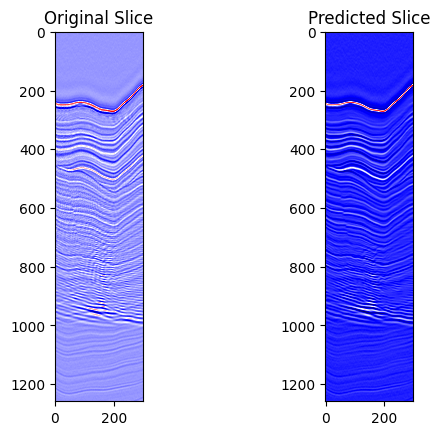

Epoch [74/200], Train Loss: 32.2021, Train SSIM: 0.9907,           Val Loss: 1447.3339, Val SSIM: 0.8415


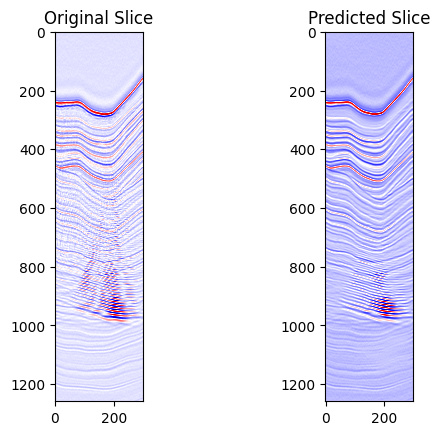

Epoch [75/200], Train Loss: 35.3359, Train SSIM: 0.9897,           Val Loss: 1466.2081, Val SSIM: 0.8495


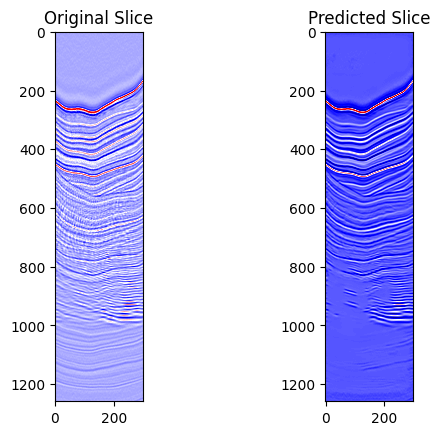

Epoch [76/200], Train Loss: 34.6620, Train SSIM: 0.9897,           Val Loss: 1591.6339, Val SSIM: 0.8088


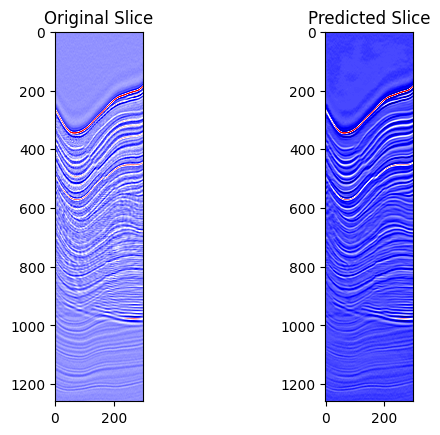

Epoch [77/200], Train Loss: 33.8066, Train SSIM: 0.9899,           Val Loss: 1484.2361, Val SSIM: 0.8445


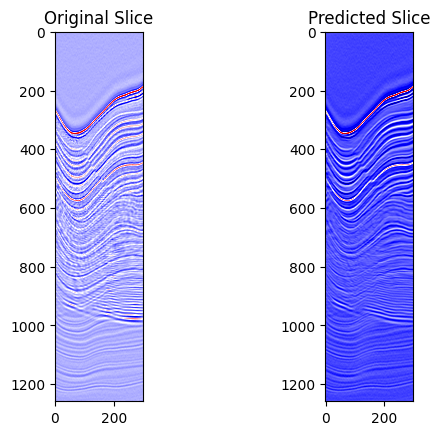

Epoch [78/200], Train Loss: 35.5251, Train SSIM: 0.9892,           Val Loss: 970.2329, Val SSIM: 0.8866


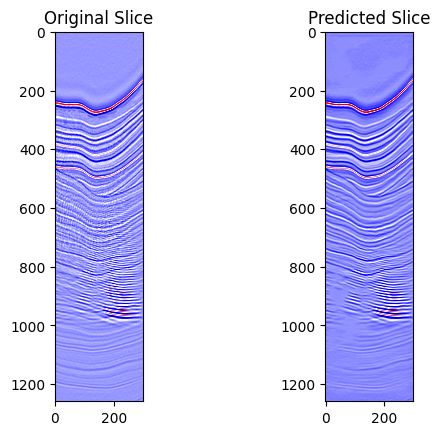

Epoch [79/200], Train Loss: 32.0712, Train SSIM: 0.9901,           Val Loss: 1534.4094, Val SSIM: 0.8426


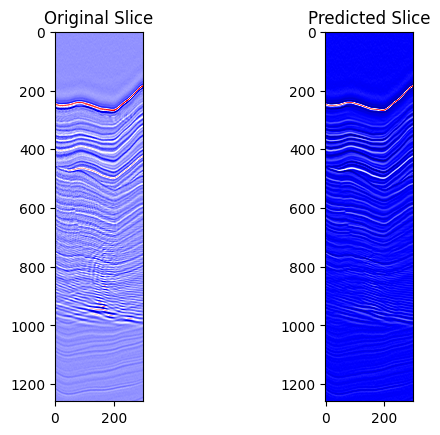

Epoch [80/200], Train Loss: 33.4728, Train SSIM: 0.9902,           Val Loss: 1451.6027, Val SSIM: 0.8153


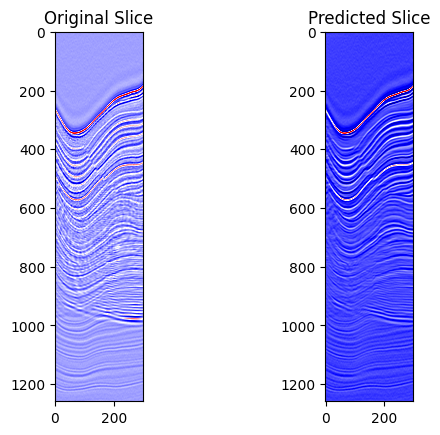

Epoch [81/200], Train Loss: 33.7565, Train SSIM: 0.9900,           Val Loss: 1514.8564, Val SSIM: 0.8543


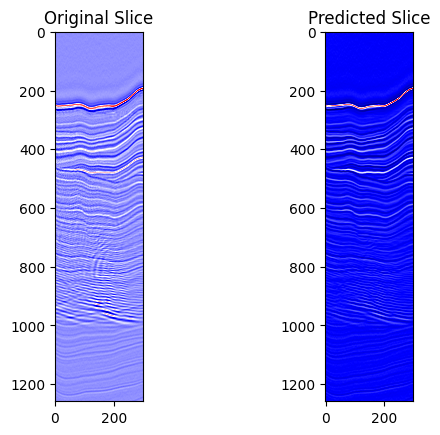

Epoch [82/200], Train Loss: 34.7186, Train SSIM: 0.9900,           Val Loss: 1070.2152, Val SSIM: 0.8689


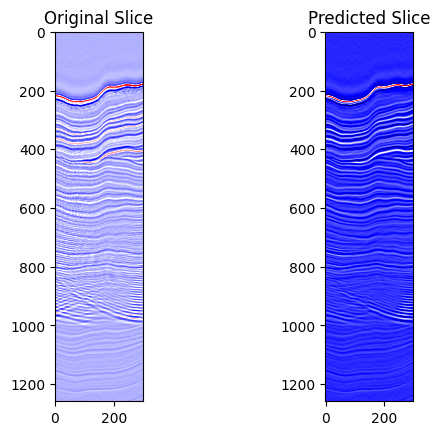

Epoch [83/200], Train Loss: 27.9617, Train SSIM: 0.9915,           Val Loss: 1626.9045, Val SSIM: 0.8373


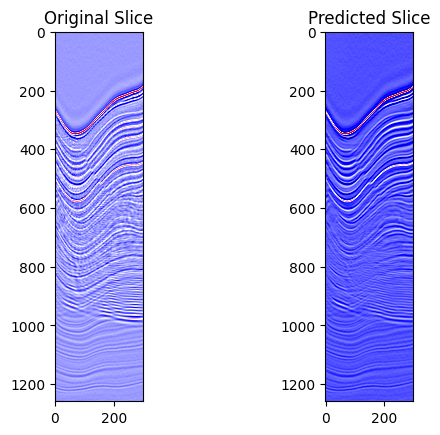

Epoch [84/200], Train Loss: 32.9358, Train SSIM: 0.9906,           Val Loss: 1008.9603, Val SSIM: 0.8786


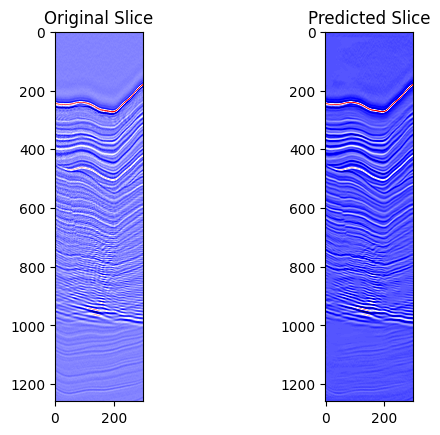

Epoch [85/200], Train Loss: 32.5158, Train SSIM: 0.9905,           Val Loss: 1719.2822, Val SSIM: 0.8243


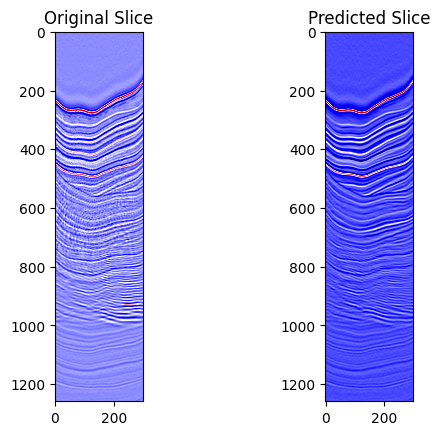

Epoch [86/200], Train Loss: 40.0908, Train SSIM: 0.9886,           Val Loss: 1178.7419, Val SSIM: 0.8191


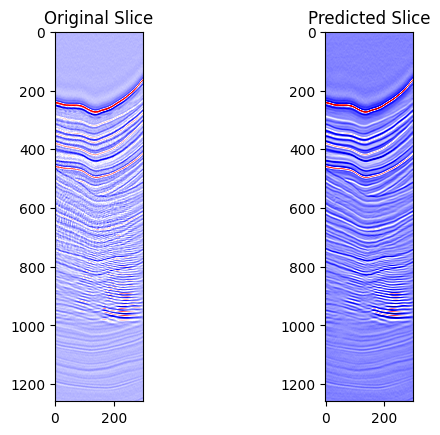

Epoch [87/200], Train Loss: 34.8533, Train SSIM: 0.9895,           Val Loss: 1606.3731, Val SSIM: 0.8373


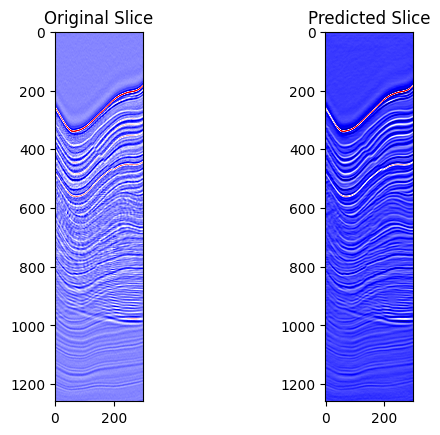

Epoch [88/200], Train Loss: 30.4782, Train SSIM: 0.9910,           Val Loss: 1526.8653, Val SSIM: 0.8459


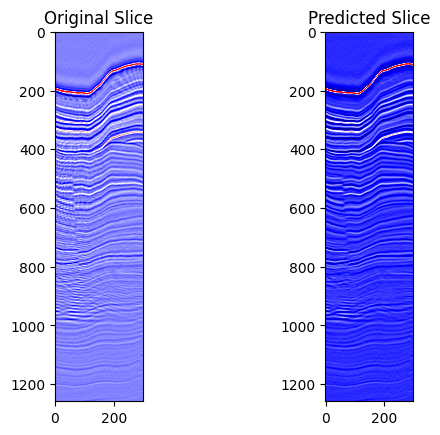

Epoch [89/200], Train Loss: 28.8087, Train SSIM: 0.9918,           Val Loss: 1600.5086, Val SSIM: 0.8435


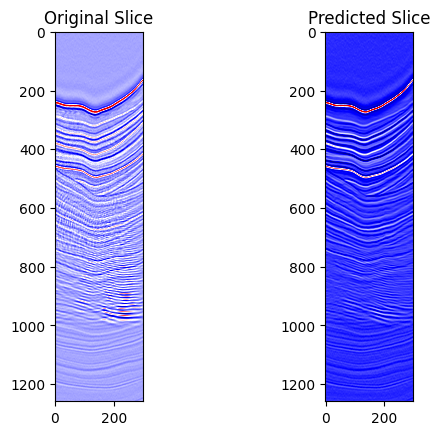

Epoch [90/200], Train Loss: 30.0660, Train SSIM: 0.9913,           Val Loss: 1064.3985, Val SSIM: 0.8754


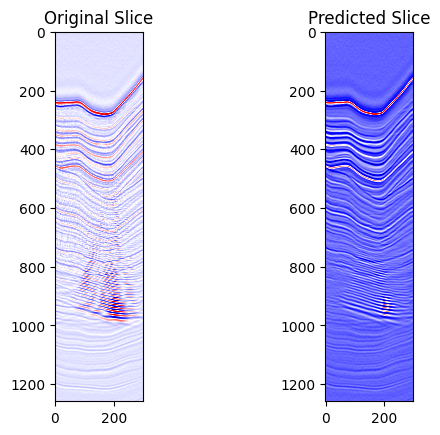

Epoch [91/200], Train Loss: 33.5539, Train SSIM: 0.9902,           Val Loss: 1192.2493, Val SSIM: 0.8765


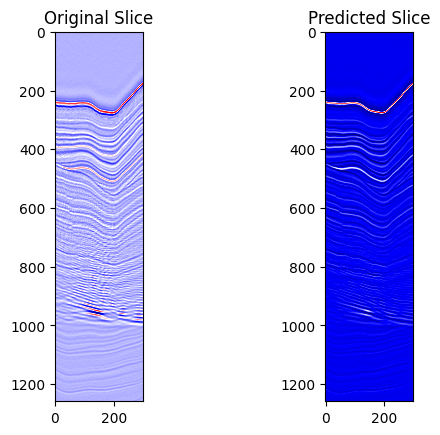

Epoch [92/200], Train Loss: 32.3112, Train SSIM: 0.9909,           Val Loss: 1471.8653, Val SSIM: 0.8426


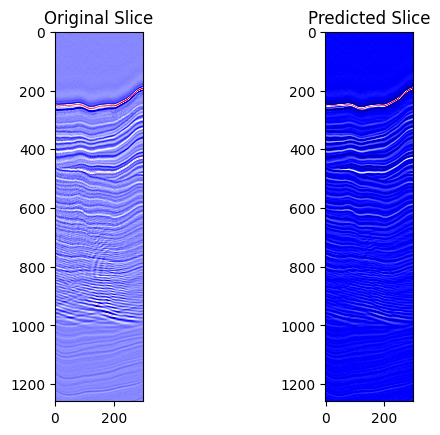

Epoch [93/200], Train Loss: 24.7617, Train SSIM: 0.9922,           Val Loss: 1500.6611, Val SSIM: 0.8494


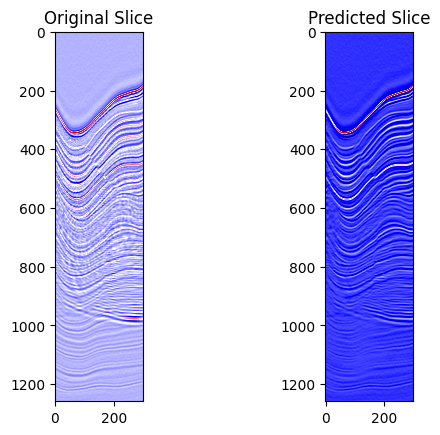

Epoch [94/200], Train Loss: 27.7096, Train SSIM: 0.9924,           Val Loss: 1606.0082, Val SSIM: 0.8396


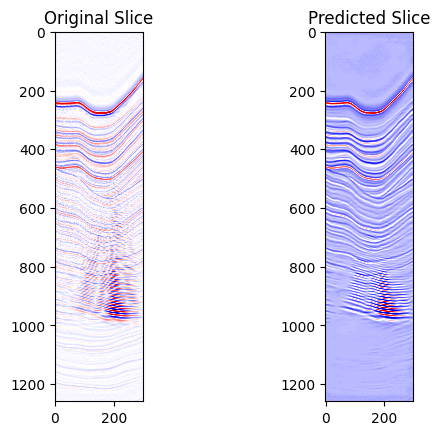

Epoch [95/200], Train Loss: 25.8926, Train SSIM: 0.9923,           Val Loss: 1671.0516, Val SSIM: 0.8122


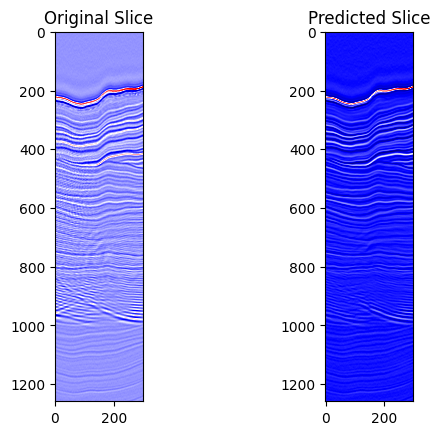

Epoch [96/200], Train Loss: 22.7650, Train SSIM: 0.9932,           Val Loss: 1439.3376, Val SSIM: 0.8536


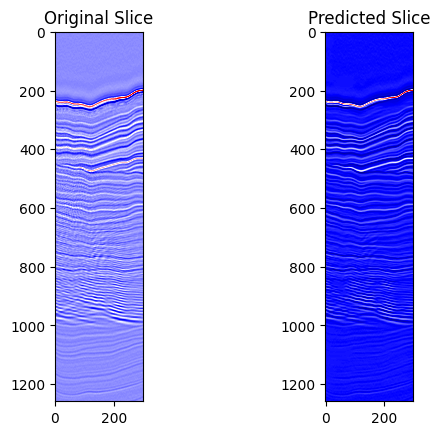

Epoch [97/200], Train Loss: 29.3424, Train SSIM: 0.9912,           Val Loss: 1756.2480, Val SSIM: 0.8147


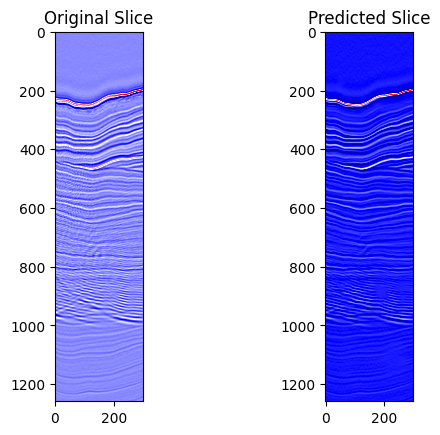

Epoch [98/200], Train Loss: 29.3834, Train SSIM: 0.9910,           Val Loss: 1596.6791, Val SSIM: 0.8337


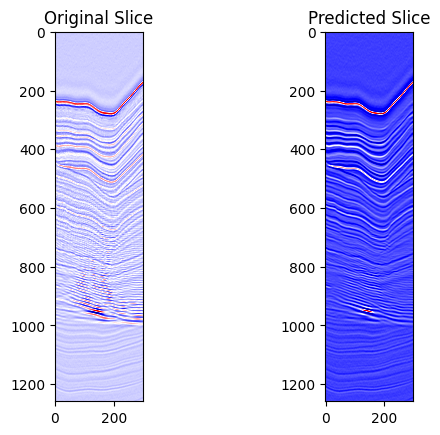

Epoch [99/200], Train Loss: 25.5652, Train SSIM: 0.9924,           Val Loss: 1506.5120, Val SSIM: 0.8518


In [ ]:
# Number of epochs
num_epochs = 200

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_ssim = 0.0

    for x_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(x_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        batch_ssim = ssim_metric(outputs.detach(), y_batch.detach())
        running_ssim += batch_ssim.item()

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_ssim = 0.0
    with torch.no_grad():
        for x_val, y_val in val_loader:
            val_outputs = model(x_val)
            val_loss += criterion(val_outputs, y_val).item()
            val_ssim += ssim_metric(val_outputs, y_val).item()

    # Prediction on a single slice from X_slices_t
    random_slice = X_slices_t[torch.randint(0, len(X_slices_t), (1,)).item()]

    # Convert to PyTorch tensor and add batch and channel dimensions
    random_slice = torch.tensor(random_slice, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    prediction = model(random_slice).detach()

    # Visualize the original and predicted slice
    plt.subplot(1, 2, 1)
    plt.title("Original Slice")
    plt.imshow(random_slice.squeeze().cpu().numpy(), cmap='seismic')

    plt.subplot(1, 2, 2)
    plt.title("Predicted Slice")
    plt.imshow(prediction.squeeze().cpu().numpy(), cmap='seismic')
    plt.show()

    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {running_loss / len(train_loader):.4f}, Train SSIM: {running_ssim / len(train_loader):.4f}, \
          Val Loss: {val_loss / len(val_loader):.4f}, Val SSIM: {val_ssim / len(val_loader):.4f}")


print("Training complete!")
